<a href="https://colab.research.google.com/github/nikoshaa/2141720007-pcvk-2023/blob/main/Week-5/Week05.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Wildan Hafidz Mauludin

2141720007

Operasi Aritmatika dan Logika - Gamma Correction, Image Depth, PSNR, Average Denoising, Image Masking

Tugas Praktikum

1. Buat Gamma Correction

Percobaan ini akan meminta anda membuat Gamma Correction. Pada percobaan ini, nilai Gamma akan diset dengan meminta masukan dari pengguna. Berikut adalah kode untuk meminta masukan nilai dari pengguna. Lanjutkan kode tersebut dengan membuat image dengan gamma correction sesuai rumus yang telah diberikan.

Mounted at /content/drive
Gamma Correction pada Citra
----------------------------------
Masukkan nilai Gamma: 5


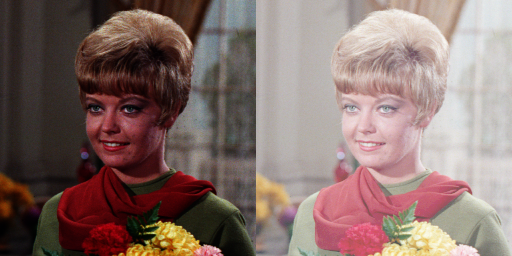

In [1]:
# akses folder image pada Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Import library yang diperlukan
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np

# Menampilkan pesan awal
print('Gamma Correction pada Citra')
print('----------------------------------')

# Membaca input nilai gamma dari pengguna
try:
  gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
  print('Error, bukan angka')

# Membaca data gambar dari Google Drive
original = cv.imread('/content/drive/MyDrive/female.tiff')

# Membuat citra baru dengan ukuran yang sama dengan citra asli
gamma_image = np.zeros(original.shape, original.dtype)

# Melakukan normalisasi gambar ke rentang [0, 1], lalu menerapkan koreksi gamma, dan mengubah skala kembali ke [0, 255]
# Operasi gamma dengan operasi vektor Python (dikomentari)
# gamma_corrected = np.clip((255.0 * (original / 255.0) ** (1.0 / gamma)), 0, 255).astype(np.uint8)

# Melakukan koreksi gamma secara manual per piksel dengan looping
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
        gamma_image[y, x, c] = np.clip(255.0 * (original[y, x, c] / 255.0) ** (1.0 / gamma), 0, 255)

# Menggabungkan citra asli dan citra yang telah mengalami koreksi gamma secara horizontal
final_frame = cv.hconcat((original, gamma_image))

# Menampilkan citra yang telah mengalami koreksi gamma
cv2_imshow(final_frame)

Gambar diatas adalah citra yang diproses menggunakan Gamma Correction nilai
gamma 3.

2. Buat Simulasi Image Depth

Percobaan ini digunakan sebagai simulasi dari proses kuantisasi citra. Pada kuantisasi citra,
pixel dapat direpresentasikan dengan n-bit kedalaman (default menggunakan 8-bit). Pada
pixel 8-bit, warna yang memungkinkan adalah 256 warna, dari 0 (0000 0000) hingga
255(1111 1111). Pada pixel 7-bit, warna yang memungkinkan adalah 128 warna, dari 0 (000
0000) hingga 127 (111 1111). Kemungkinan warna didapat dari pangkat 2 jumlah bit. Jika
7bit, maka jumlah warnanya adalah 27
 = 128, dst

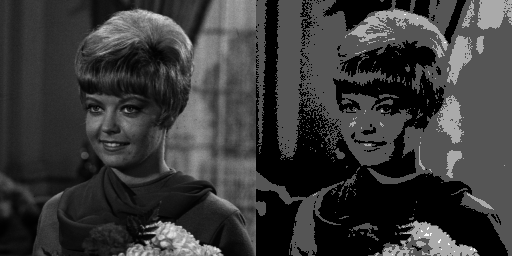

In [2]:
# Import library yang diperlukan
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np

# Definisikan kedalaman bit (bit_depth)
bit_depth = 2

# Hitung nilai level yang digunakan untuk normalisasi citra
level = 255 / (pow(2, bit_depth) - 1)

# Membaca citra grayscale dari Google Drive
original1 = cv.imread('/content/drive/MyDrive/female.tiff', cv.IMREAD_GRAYSCALE)

# Membuat citra baru dengan ukuran yang sama dengan citra grayscale asli
depth_image = np.zeros(original1.shape, original1.dtype)

# Melakukan reduksi kedalaman bit per piksel dengan looping
for y in range(original1.shape[0]):
  for x in range(original1.shape[1]):
    # Menghitung nilai intensitas piksel yang baru dengan melakukan pembagian dan pembulatan
    depth_image[y, x] = np.clip(round(original1[y, x] / level) * level, 0, 255)

# Menggabungkan citra grayscale asli dan citra yang telah mengalami reduksi kedalaman bit secara horizontal
final_frame = cv.hconcat((original1, depth_image))

# Menampilkan citra yang telah mengalami reduksi kedalaman bit
cv2_imshow(final_frame)

3. Buat modul Average Denoising

Buat modul average denoising sesuai dengan rumus yang telah diberikan pada sub bab sebelumnya. Citra asli sudah disediakan pada /images/galaxy.jpg. 100 Citra dengan Gaussian Noise sudah disediakan pada /images/noises/*.jpg Anda dapat menggunakan code berikut untuk membaca semua image dalam satu folder , gunakan modul glob (import glob).

Jumlah Citra di Average 5

27.53692364314938 dB


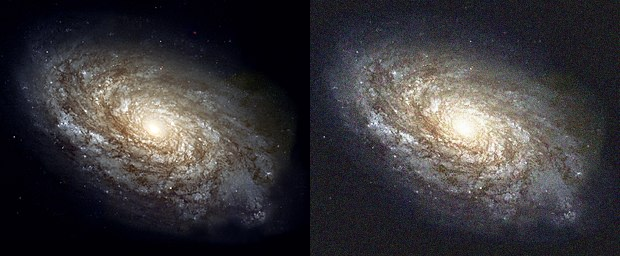

In [3]:
# Import library yang diperlukan
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
from math import log10, sqrt
import glob

# Membaca semua citra dari folder 'noises' di Google Drive dan menyimpannya dalam list cv_img
cv_img = []
for img in glob.glob('/content/drive/MyDrive/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

# Membaca citra asli
ori = cv.imread('/content/drive/MyDrive/galaxy.jpg')

# Menginisialisasi citra denoised sebagai array nol dengan ukuran yang sama seperti citra dalam cv_img[0]
denoise_image = np.zeros(cv_img[0].shape)

# Menentukan berapa banyak gambar yang akan digunakan untuk penggabungan (10 gambar dalam hal ini)
jumlah_gambar = 5

# Melakukan penggabungan citra dengan menjumlahkan citra-citra dalam cv_img
for i in range(jumlah_gambar):
    denoise_image = denoise_image + cv_img[i]

# Menghitung citra rata-rata dari citra yang telah digabungkan
denoise_image = np.uint8(denoise_image / jumlah_gambar)

# Mendefinisikan fungsi untuk mengukur PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if (mse == 0):
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Mengukur nilai PSNR antara citra asli (ori) dan citra denoised
psnr_value = PSNR(ori, denoise_image)
print(psnr_value, 'dB')

# Menggabungkan citra asli dan citra denoised secara horizontal dan menampilkannya
final_frame = cv.hconcat((ori, denoise_image))
cv2_imshow(final_frame)

Jumlah Citra di Average 10

27.55149978876299 dB


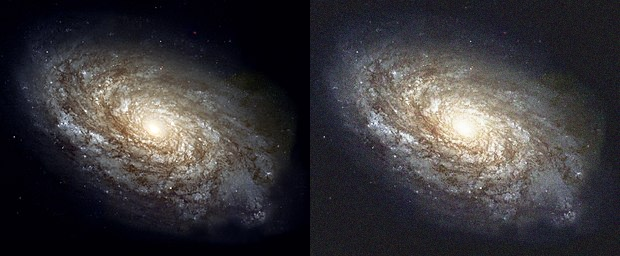

In [4]:
# Import library yang diperlukan
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
from math import log10, sqrt
import glob

# Membaca semua citra dari folder 'noises' di Google Drive dan menyimpannya dalam list cv_img
cv_img = []
for img in glob.glob('/content/drive/MyDrive/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

# Membaca citra asli
ori = cv.imread('/content/drive/MyDrive/galaxy.jpg')

# Menginisialisasi citra denoised sebagai array nol dengan ukuran yang sama seperti citra dalam cv_img[0]
denoise_image = np.zeros(cv_img[0].shape)

# Menentukan berapa banyak gambar yang akan digunakan untuk penggabungan (10 gambar dalam hal ini)
jumlah_gambar = 10

# Melakukan penggabungan citra dengan menjumlahkan citra-citra dalam cv_img
for i in range(jumlah_gambar):
    denoise_image = denoise_image + cv_img[i]

# Menghitung citra rata-rata dari citra yang telah digabungkan
denoise_image = np.uint8(denoise_image / jumlah_gambar)

# Mendefinisikan fungsi untuk mengukur PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if (mse == 0):
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Mengukur nilai PSNR antara citra asli (ori) dan citra denoised
psnr_value = PSNR(ori, denoise_image)
print(psnr_value, 'dB')

# Menggabungkan citra asli dan citra denoised secara horizontal dan menampilkannya
final_frame = cv.hconcat((ori, denoise_image))
cv2_imshow(final_frame)

Jumlah Citra di Average 20

27.513946206251706 dB


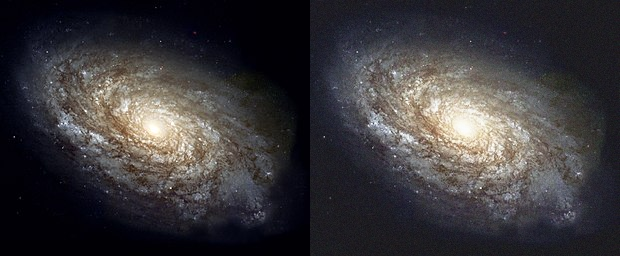

In [5]:
# Import library yang diperlukan
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
from math import log10, sqrt
import glob

# Membaca semua citra dari folder 'noises' di Google Drive dan menyimpannya dalam list cv_img
cv_img = []
for img in glob.glob('/content/drive/MyDrive/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

# Membaca citra asli
ori = cv.imread('/content/drive/MyDrive/galaxy.jpg')

# Menginisialisasi citra denoised sebagai array nol dengan ukuran yang sama seperti citra dalam cv_img[0]
denoise_image = np.zeros(cv_img[0].shape)

# Menentukan berapa banyak gambar yang akan digunakan untuk penggabungan (10 gambar dalam hal ini)
jumlah_gambar = 20

# Melakukan penggabungan citra dengan menjumlahkan citra-citra dalam cv_img
for i in range(jumlah_gambar):
    denoise_image = denoise_image + cv_img[i]

# Menghitung citra rata-rata dari citra yang telah digabungkan
denoise_image = np.uint8(denoise_image / jumlah_gambar)

# Mendefinisikan fungsi untuk mengukur PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if (mse == 0):
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Mengukur nilai PSNR antara citra asli (ori) dan citra denoised
psnr_value = PSNR(ori, denoise_image)
print(psnr_value, 'dB')

# Menggabungkan citra asli dan citra denoised secara horizontal dan menampilkannya
final_frame = cv.hconcat((ori, denoise_image))
cv2_imshow(final_frame)

Jumlah Citra di Average 40

27.458051914176863 dB


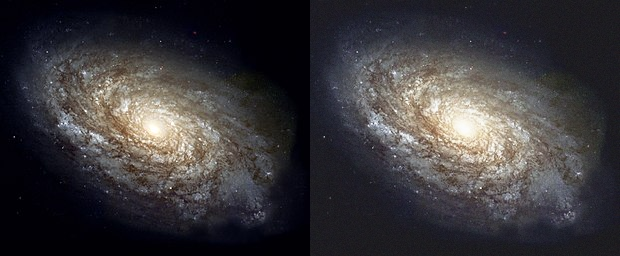

In [6]:
# Import library yang diperlukan
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
from math import log10, sqrt
import glob

# Membaca semua citra dari folder 'noises' di Google Drive dan menyimpannya dalam list cv_img
cv_img = []
for img in glob.glob('/content/drive/MyDrive/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

# Membaca citra asli
ori = cv.imread('/content/drive/MyDrive/galaxy.jpg')

# Menginisialisasi citra denoised sebagai array nol dengan ukuran yang sama seperti citra dalam cv_img[0]
denoise_image = np.zeros(cv_img[0].shape)

# Menentukan berapa banyak gambar yang akan digunakan untuk penggabungan (10 gambar dalam hal ini)
jumlah_gambar = 40

# Melakukan penggabungan citra dengan menjumlahkan citra-citra dalam cv_img
for i in range(jumlah_gambar):
    denoise_image = denoise_image + cv_img[i]

# Menghitung citra rata-rata dari citra yang telah digabungkan
denoise_image = np.uint8(denoise_image / jumlah_gambar)

# Mendefinisikan fungsi untuk mengukur PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if (mse == 0):
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Mengukur nilai PSNR antara citra asli (ori) dan citra denoised
psnr_value = PSNR(ori, denoise_image)
print(psnr_value, 'dB')

# Menggabungkan citra asli dan citra denoised secara horizontal dan menampilkannya
final_frame = cv.hconcat((ori, denoise_image))
cv2_imshow(final_frame)

Jumlah Citra di Average 80

27.3941703109432 dB


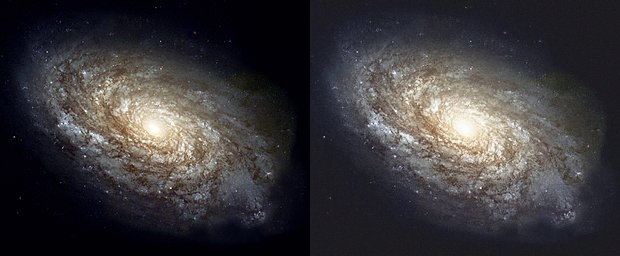

In [7]:
# Import library yang diperlukan
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
from math import log10, sqrt
import glob

# Membaca semua citra dari folder 'noises' di Google Drive dan menyimpannya dalam list cv_img
cv_img = []
for img in glob.glob('/content/drive/MyDrive/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

# Membaca citra asli
ori = cv.imread('/content/drive/MyDrive/galaxy.jpg')

# Menginisialisasi citra denoised sebagai array nol dengan ukuran yang sama seperti citra dalam cv_img[0]
denoise_image = np.zeros(cv_img[0].shape)

# Menentukan berapa banyak gambar yang akan digunakan untuk penggabungan (10 gambar dalam hal ini)
jumlah_gambar = 80

# Melakukan penggabungan citra dengan menjumlahkan citra-citra dalam cv_img
for i in range(jumlah_gambar):
    denoise_image = denoise_image + cv_img[i]

# Menghitung citra rata-rata dari citra yang telah digabungkan
denoise_image = np.uint8(denoise_image / jumlah_gambar)

# Mendefinisikan fungsi untuk mengukur PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if (mse == 0):
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Mengukur nilai PSNR antara citra asli (ori) dan citra denoised
psnr_value = PSNR(ori, denoise_image)
print(psnr_value, 'dB')

# Menggabungkan citra asli dan citra denoised secara horizontal dan menampilkannya
final_frame = cv.hconcat((ori, denoise_image))
cv2_imshow(final_frame)

Jumlah Citra di Average 100

27.370931279516654 dB


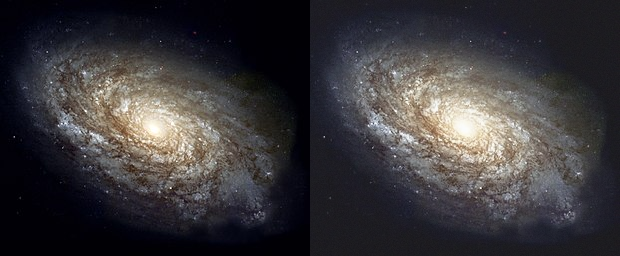

In [8]:
# Import library yang diperlukan
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
from math import log10, sqrt
import glob

# Membaca semua citra dari folder 'noises' di Google Drive dan menyimpannya dalam list cv_img
cv_img = []
for img in glob.glob('/content/drive/MyDrive/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

# Membaca citra asli
ori = cv.imread('/content/drive/MyDrive/galaxy.jpg')

# Menginisialisasi citra denoised sebagai array nol dengan ukuran yang sama seperti citra dalam cv_img[0]
denoise_image = np.zeros(cv_img[0].shape)

# Menentukan berapa banyak gambar yang akan digunakan untuk penggabungan (10 gambar dalam hal ini)
jumlah_gambar = 100

# Melakukan penggabungan citra dengan menjumlahkan citra-citra dalam cv_img
for i in range(jumlah_gambar):
    denoise_image = denoise_image + cv_img[i]

# Menghitung citra rata-rata dari citra yang telah digabungkan
denoise_image = np.uint8(denoise_image / jumlah_gambar)

# Mendefinisikan fungsi untuk mengukur PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if (mse == 0):
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Mengukur nilai PSNR antara citra asli (ori) dan citra denoised
psnr_value = PSNR(ori, denoise_image)
print(psnr_value, 'dB')

# Menggabungkan citra asli dan citra denoised secara horizontal dan menampilkannya
final_frame = cv.hconcat((ori, denoise_image))
cv2_imshow(final_frame)

Dari hasil PSNR pada tabel diatas, kesimpulan yang dapat diambil adalah nilai PSNR cukup rendah dikarenakan di bawah 30 dB menunjukkan bahwa citra denoised mungkin memiliki banyak distorsi atau kehilangan informasi dibandingkan dengan citra asli.

4. Buat image masking untuk image berikut. Image kiri adalah image asli (image KTP),
sedangkan image paling kanan adalah hasilnya:



Gambar 3 Kelompok 5

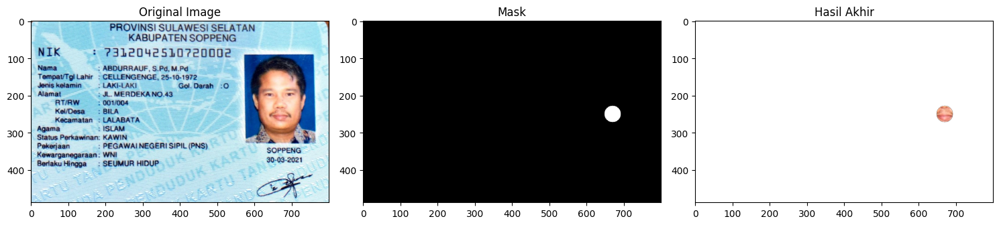

In [71]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

image_path = ('./drive/MyDrive/KTP.jpeg')
img = cv.imread(image_path)

mask = np.zeros(img.shape[:2], dtype="uint8")

cv.circle(mask, (670, 250), 22, 255, -1)

masked = cv.bitwise_and(img, img, mask=mask)

tmp = cv.cvtColor(masked, cv.COLOR_BGR2GRAY)

_, alpha = cv.threshold(tmp, 0, 255, cv.THRESH_BINARY)

b, g, r = cv.split(masked)

rgba = [b, g, r, alpha]

result = cv.merge(rgba)

plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('on')

plt.subplot(132)
plt.imshow(mask, cmap='gray')
plt.title('Mask')
plt.axis('on')

plt.subplot(133)
plt.imshow(cv.cvtColor(result, cv.COLOR_BGRA2RGBA))
plt.title('Hasil Akhir')
plt.axis('on')

plt.tight_layout()
plt.show()

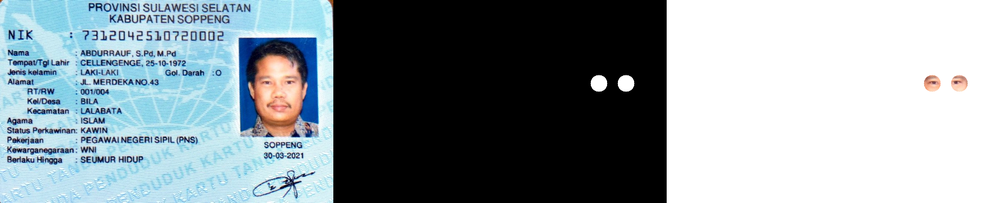

In [62]:
image_path = '/content/drive/MyDrive/KTP.jpeg'
original_image = cv.imread(image_path)

circle1 = (637, 200)
radius1 = 20
circle2 = (702, 200)
radius2 = 20

mask = np.zeros_like(original_image)

cv.circle(mask, circle1, radius1, (255, 255, 255), -1)
cv.circle(mask, circle2, radius2, (255, 255, 255), -1)

masked_image = cv.bitwise_and(original_image, mask)
masked_image[mask==0] = 255
final_frame = cv.hconcat((original_image, mask, masked_image))
cv2_imshow(final_frame)


5. Lakukan percobaan menggunakan operator lain dan tunjukkan hasilnya pada modul ini. Tuliskan hasil analisa anda kenapa citra keluarannya seperti itu.

Operasi NOT (komplemen)

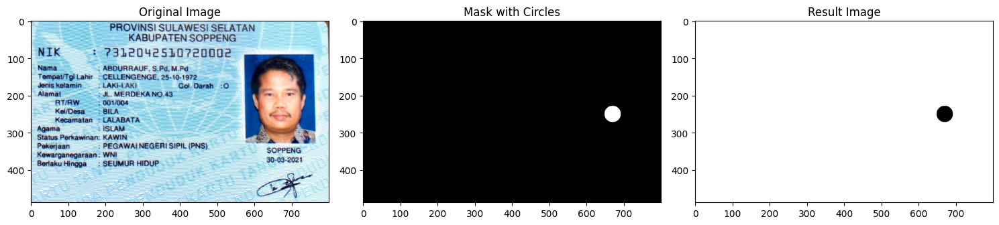

In [74]:
img = cv.imread('./drive/MyDrive/KTP.jpeg')

mask = np.zeros_like(img)

center_coordinates = (670, 250)
radius1 = 22
color = (255, 255, 255)
thickness = -1
cv.circle(mask, center_coordinates, radius1, color, thickness)

result = ~mask

plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(132)
plt.imshow(cv.cvtColor(mask, cv.COLOR_BGR2RGB))
plt.title('Mask with Circles')

plt.subplot(133)
plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
plt.title('Result Image')

plt.tight_layout()
plt.show()

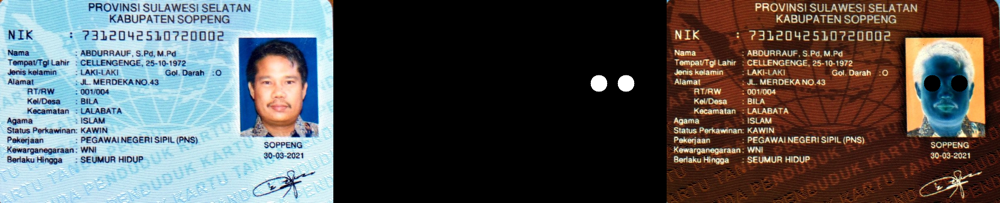

In [65]:
img = cv.imread('/content/drive/MyDrive/KTP.jpeg')

mask_not = np.zeros(img.shape, dtype = np.uint8)
mask_not = cv.circle(mask_not, (637,200), 20, (255,255,255), -1)

mask2_not = np.zeros(img.shape, dtype = np.uint8)
mask2_not = cv.circle(mask_not, (702,200), 20, (255,255,255), -1)

result = cv.bitwise_not(img) & cv.bitwise_not(mask_not)

final_frame = cv.hconcat((img, mask_not, result))
cv2_imshow(final_frame)

Gambar img menjadi inverse karna not dari sebuah image merupakan nilai inverse nya dan mask yang berwarna putih menjadi hitam karena nilai not dari mask_not merupakan bagian yang bukan lingkarannya.

Operasi OR (atau)

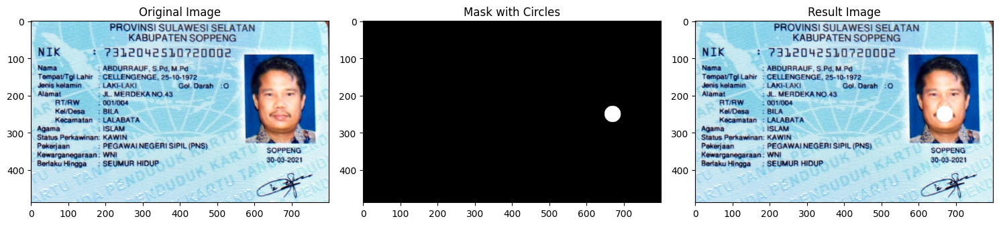

In [75]:
img = cv.imread('./drive/MyDrive/KTP.jpeg')

mask = np.zeros_like(img)

center_coordinates = (670, 250)
radius1 = 22
color = (255, 255, 255)
thickness = -1
cv.circle(mask, center_coordinates, radius1, color, thickness)

result = img | mask

plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(132)
plt.imshow(cv.cvtColor(mask, cv.COLOR_BGR2RGB))
plt.title('Mask with Circles')

plt.subplot(133)
plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
plt.title('Result Image')

plt.tight_layout()
plt.show()

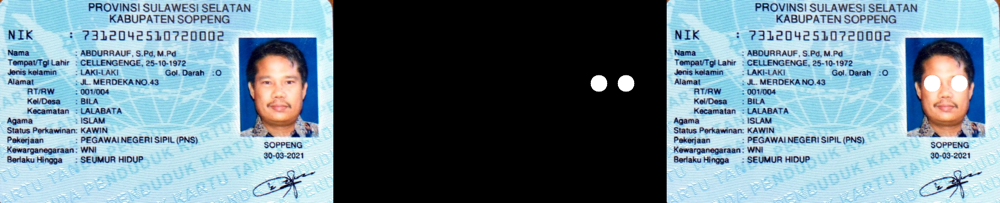

In [66]:
img = cv.imread('/content/drive/MyDrive/KTP.jpeg')

mask_or = np.zeros(img.shape, dtype = np.uint8)
mask_or = cv.circle(mask_or, (637,200), 20, (255,255,255), -1)

mask2_or = cv.circle(mask_or, (702,200), 20, (255,255,255), -1)

result = mask_or | img

final_frame = cv.hconcat((img, mask_not, result))
cv2_imshow(final_frame)

Ketika menggunakan operasi OR maka semua bagian yang di img dan bagian lingkaran max memenuhi kebutuhan sehingga img dan max_or akan di gabungkan dan keduanya memenuhi sehingga tampil seluruh img berwarna yang di tumpuk oleh linkaran mask_or.

Operator AND (Dan)

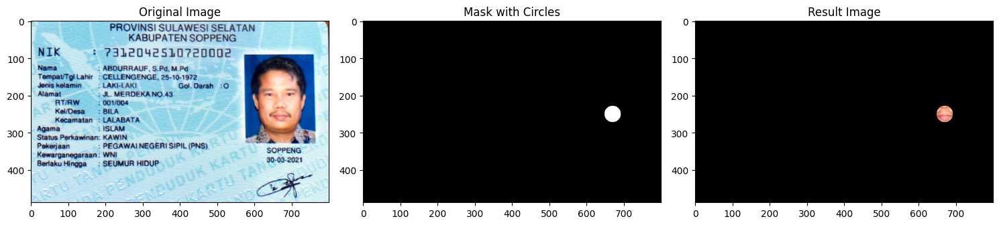

In [77]:
image_path = './drive/MyDrive/KTP.jpeg'
img = cv.imread(image_path)

mask = np.zeros_like(img)

center_coordinates = (670, 250)
radius1 = 22
color = (255, 255, 255)
thickness = -1
cv.circle(mask, center_coordinates, radius1, color, thickness)

result = img & mask

plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(132)
plt.imshow(cv.cvtColor(mask, cv.COLOR_BGR2RGB))
plt.title('Mask with Circles')

plt.subplot(133)
plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
plt.title('Result Image')

plt.tight_layout()
plt.show()

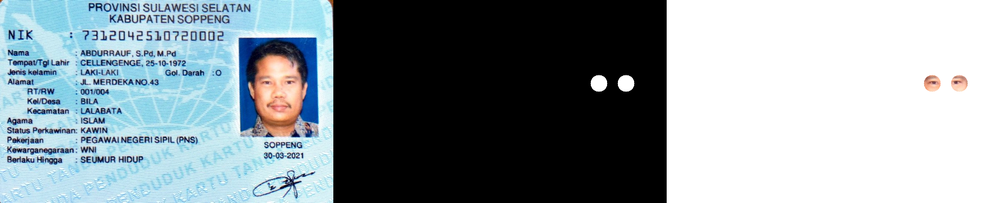

In [67]:
img = cv.imread('/content/drive/MyDrive/KTP.jpeg')

mask = np.zeros(img.shape, dtype = np.uint8)
mask = cv.circle(mask, (637,200), 20, (255,255,255), -1)

mask2 = np.zeros(img.shape, dtype = np.uint8)
mask2 = cv.circle(mask, (702,200), 20, (255,255,255), -1)

result = img & mask & mask2

result[mask==0] = 255

final_frame = cv.hconcat((img, mask, result))
cv2_imshow(final_frame)

Menggunakan operas AND memiliki hasil yang sama seperti contoh dimana elemen yang diambil adalah gambar yang memiliki letak bertepatan dengan mask (lingkarannya).

Operator NAND (Not And)

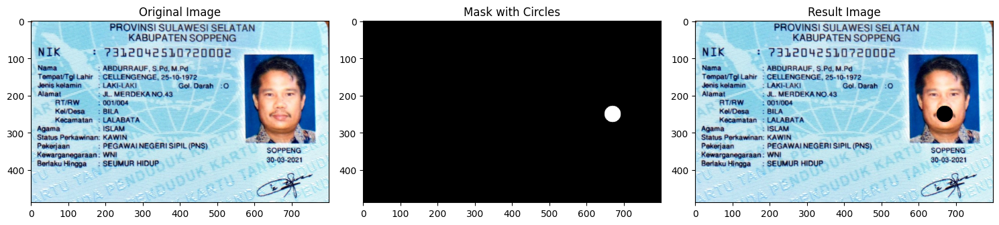

In [78]:
img = cv.imread('./drive/MyDrive/KTP.jpeg')

mask = np.zeros_like(img)

center_coordinates = (670, 250)
radius1 = 22
color = (255, 255, 255)
thickness = -1
cv.circle(mask, center_coordinates, radius1, color, thickness)

result = img & ~mask

plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(132)
plt.imshow(cv.cvtColor(mask, cv.COLOR_BGR2RGB))
plt.title('Mask with Circles')

plt.subplot(133)
plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
plt.title('Result Image')

plt.tight_layout()
plt.show()

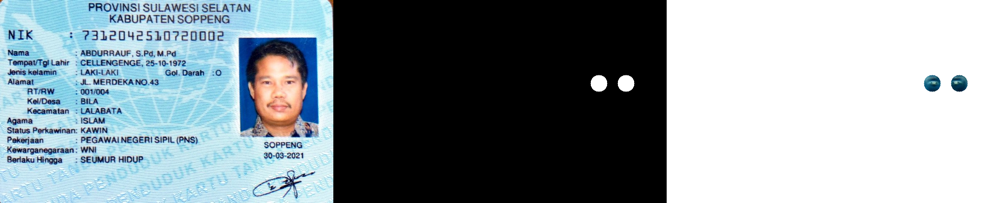

In [68]:
img = cv.imread('/content/drive/MyDrive/KTP.jpeg')

mask = np.zeros(img.shape, dtype = np.uint8)
mask = cv.circle(mask, (637,200), 20, (255,255,255), -1)

mask2 = np.zeros(img.shape, dtype = np.uint8)
mask2 = cv.circle(mask, (702,200), 20, (255,255,255), -1)

result = cv.bitwise_not(cv.bitwise_and(img,mask))

final_frame = cv.hconcat((img, mask_not, result))
cv2_imshow(final_frame)

Menggunakan operator NAND yaitu melakukan operasi and terlebih dahulu yang menghasilkan gambar yang muncul hanya yang memiliki letak bertepatan dengan mask(lingkaran) setelah itu barulah dilakukan not untuk img dan mask sehingga bagian diluar lingkaranlah yang berwarna putih dan bagian lingkaran menjadi lubang dan ketika di gabungkan dengan img maka akan terlihat bagian img yang memiliki letak sama dengan lingkaran yang lubang tadi.

Operator XOR (Exlusive Or)

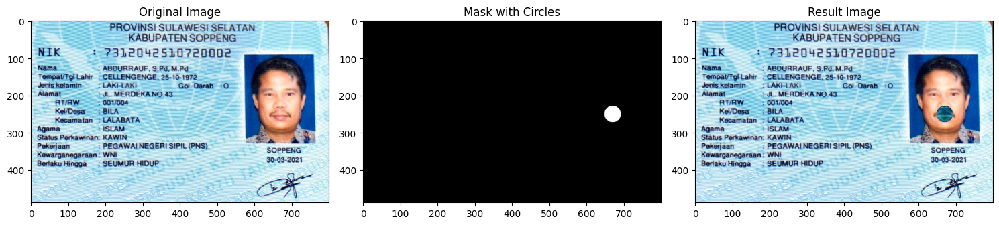

In [80]:
img = cv.imread('./drive/MyDrive/KTP.jpeg')

mask = np.zeros_like(img)

center_coordinates = (670, 250)
radius1 = 22
color = (255, 255, 255)
thickness = -1
cv.circle(mask, center_coordinates, radius1, color, thickness)

result = img ^ mask

plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(132)
plt.imshow(cv.cvtColor(mask, cv.COLOR_BGR2RGB))
plt.title('Mask with Circles')

plt.subplot(133)
plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
plt.title('Result Image')

plt.tight_layout()
plt.show()

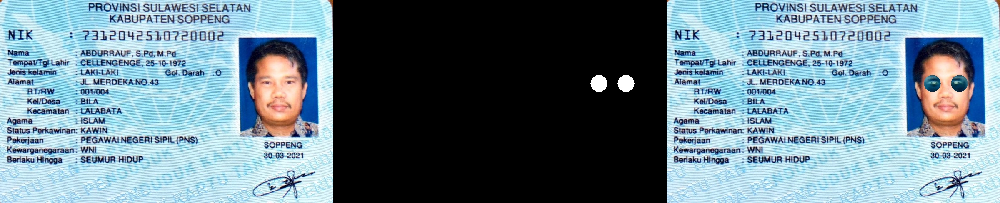

In [69]:
img = cv.imread('/content/drive/MyDrive/KTP.jpeg')

mask = np.zeros(img.shape, dtype = np.uint8)
mask = cv.circle(mask, (637,200), 20, (255,255,255), -1)

mask2 = np.zeros(img.shape, dtype = np.uint8)
mask2 = cv.circle(mask, (702,200), 20, (255,255,255), -1)

result = cv.bitwise_xor(img, mask)

final_frame = cv.hconcat((img, mask_not, result))
cv2_imshow(final_frame)

Untuk operator XOR bagian yang beririsan dari image dan mask akan di tampilkan dengan hasil inverse dan bagian yang tidak beririsan antara image dan mask akan tetap di tampilkan seperti gambar image sebenarnya.